This should be present always:

> The goals / steps of this project are the following:

>    * Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
>    * Apply a distortion correction to raw images.
>    * Use color transforms, gradients, etc., to create a thresholded binary image.
>    * Apply a perspective transform to rectify binary image ("birds-eye view").
>    * Detect lane pixels and fit to find the lane boundary.
>    * Determine the curvature of the lane and vehicle position with respect to center.
>    * Warp the detected lane boundaries back onto the original image.
>    * Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [2]:
import os
import cv2
import glob
import pickle
import numpy as np
import pylab as plt
from IPython.display import Image

# This is deprecated: import Ipython.html.widgets instead:
import ipywidgets

%matplotlib inline

In [3]:
path2calib_im = "./camera_cal/"
path2test_im = "./test_images/"
pattern = "*.jpg"

In [4]:
camera_calibration = pickle.load(open(path2calib_im + "calibration_data.pkl", "rb" ))
test_images = glob.glob(path2test_im + pattern)

laboratory_rat = cv2.imread(test_images[1])
laboratory_rat = laboratory_rat[...,::-1] # BGR to RGB. Also works img = img[:,:,::-1] and gbr = rgb[...,[2,0,1]]

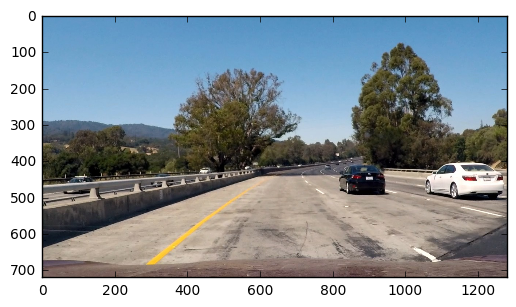

In [23]:
_ = plt.imshow(laboratory_rat)

In [3]:
# Let's define a function that carry on with all the steps

def pipeline(image, camera_calibration, perspective_matrix):
    
    # Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
    # Already done in Camera calibration.ipynb
    
    # Apply a distortion correction to raw images.
    undistorted = undistort(image, camera_calibration)
    
    # Use color transforms, gradients, etc., to create a thresholded binary image.
    thresholded = threshold(undistorted)
    
    # Apply a perspective transform to rectify binary image ("birds-eye view").
    birds_eye = perspective(thresholded, perspective_matrix)
    
    # Detect lane pixels and fit to find the lane boundary.
    detected_lanes, polynomials = detect_lanes(birds_eye)
    
    # Determine the curvature of the lane and vehicle position with respect to center.
    curvature = get_curvature(detected_lanes, polynomials)
    
    # Warp the detected lane boundaries back onto the original image.
    image_lanes = get_original_with_lanes()
    
    # Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
    final_image = visualization(image_lanes, curvature, vehicle_position)
    
    # TODO: where to get vehicle_position?
    
    return final_image

# Let's tackle block by block

## Apply a distortion correction to raw images.

In [5]:
def undistort(image, camera_calibration):
    mtx = camera_calibration['mtx']
    dist = camera_calibration['dist']
    
    return cv2.undistort(image, mtx, dist, None, mtx)

In [6]:
def visualize_before_after(image_before, image_after, cmap=None):
    plt.figure(figsize=(15, 10))
    
    plt.subplot(1,2,1)
    plt.imshow(image_before)
    plt.title("Image before")
    
    plt.subplot(1,2,2)
    if cmap:
        plt.imshow(image_after, cmap=cmap)
    else:
        plt.imshow(image_after)
    plt.title("Image after")

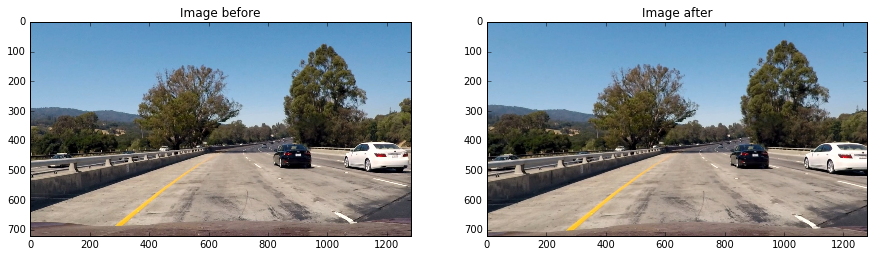

In [7]:
undistorted = undistort(laboratory_rat, camera_calibration)
visualize_before_after(laboratory_rat, undistorted)

It can be observed that the white car is cropped after undistortion

## Use color transforms, gradients, etc., to create a thresholded binary image.

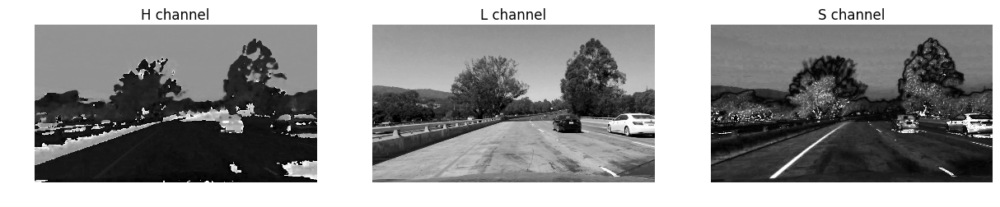

In [34]:
hls = cv2.cvtColor(undistorted, cv2.COLOR_RGB2HLS)
h = hls[...,0]
l = hls[...,1]
s = hls[...,2]

plt.figure(figsize=(15, 20))
plt.subplot(1, 3, 1)
plt.imshow(h, cmap='gray')
plt.title("H channel")
_ = plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(l, cmap='gray')
plt.title("L channel")
_ = plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(s, cmap='gray')
plt.title("S channel")
_ = plt.axis('off')

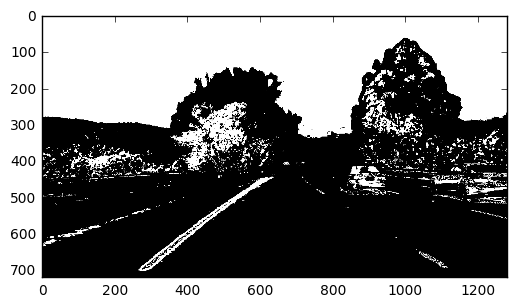

In [87]:
def color_threshold_slider(lower_th, upper_th):
    thresholded = np.zeros_like(s)
    thresholded[(s > lower_th) & (s < upper_th)] = 255
    plt.imshow(thresholded, cmap='gray')

_ = ipywidgets.interact(color_threshold_slider, lower_th=(0, 255, 1), upper_th=(0, 255, 1))
# The idea came from https://blog.dominodatalab.com/interactive-dashboards-in-jupyter/
# However, the imports were moved in newer ersions of Ipython

85 (lower) and 255 (upper) seems to be the best thresholds for channel S

Let's personalize thresholds for both lane lines colors.

Go for yellow one

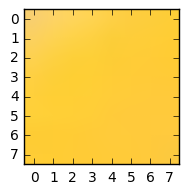

In [125]:
# Get HLS value of the yellow lane
plt.figure(figsize=(2,2))
_ = plt.imshow(undistorted[652: 660, 327:335])

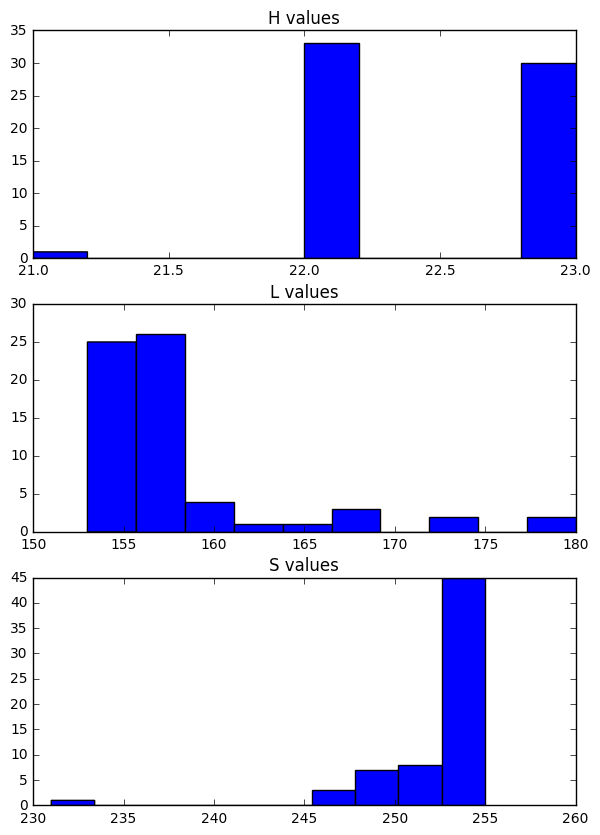

In [130]:
yellow_patch = hls[652: 660, 327:335]

h = yellow_patch[...,0].ravel()
l = yellow_patch[...,1].ravel()
s = yellow_patch[...,2].ravel()

plt.figure(figsize=(7, 10))
plt.subplot(3,1,1)
ret_h = plt.hist(h)
_ = plt.title("H values")
plt.subplot(3,1,2)
ret_l = plt.hist(l)
_ = plt.title("L values")
plt.subplot(3,1,3)
ret_s = plt.hist(s)
_ = plt.title("S values")

Let's get the value most frequent in this patch, e.g. the mode

In [134]:
h_mode = int(ret_h[1][np.argmax(ret_h[0])])
l_mode = int(ret_l[1][np.argmax(ret_l[0])])
s_mode = int(ret_s[1][np.argmax(ret_s[0])])

print("The most frequent value in this patch is: ", (h_mode, l_mode, s_mode))

The most frequent value in this patch is:  (22, 155, 252)


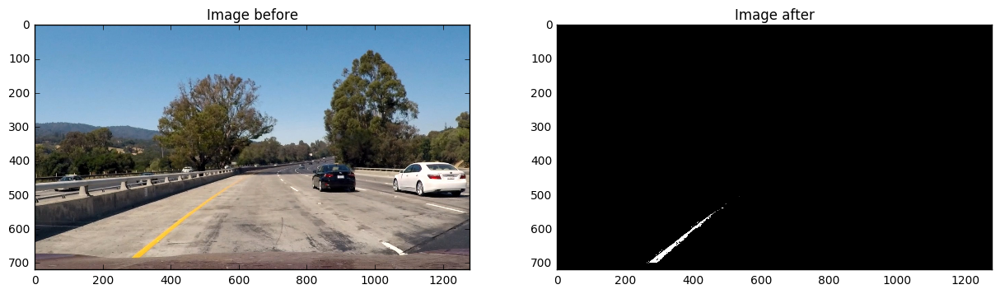

In [135]:
# Let's try this ranges:
lower_th = (10, 145, 86)
upper_th = (32, 165, 255)

yellow_lane = cv2.inRange(hls, lower_th, upper_th)
visualize_before_after(laboratory_rat, yellow_lane, cmap='gray')

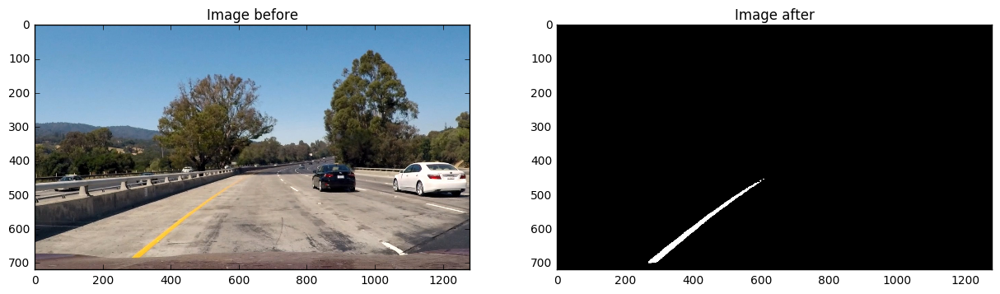

In [138]:
# Not well enough, let's try something else

def color_threshold_slider2(lower_h, upper_h, lower_l, upper_l, lower_s, upper_s):
    lower_th = (lower_h, lower_l, lower_s)
    upper_th = (upper_h, upper_l, upper_s)
    
    yellow_lane = cv2.inRange(hls, lower_th, upper_th)
    visualize_before_after(laboratory_rat, yellow_lane, cmap='gray')

_ = ipywidgets.interact(color2_threshold_slider2, lower_h=(0, 255, 5), upper_h=(0, 255, 5), lower_l=(0, 255, 5), \
                        upper_l=(0, 255, 5), lower_s=(0, 255, 5), upper_s=(0, 255, 5))

In [174]:
# Final threshold for yellow lane lines:

yellow_lower_th = (15, 75, 125)
yellow_upper_th = (35, 200, 255)

Go for white lane

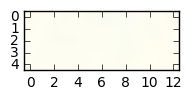

In [154]:
# Get HLS value of the white lane
plt.figure(figsize=(2,1))
_ = plt.imshow(undistorted[680:685, 1087:1100])

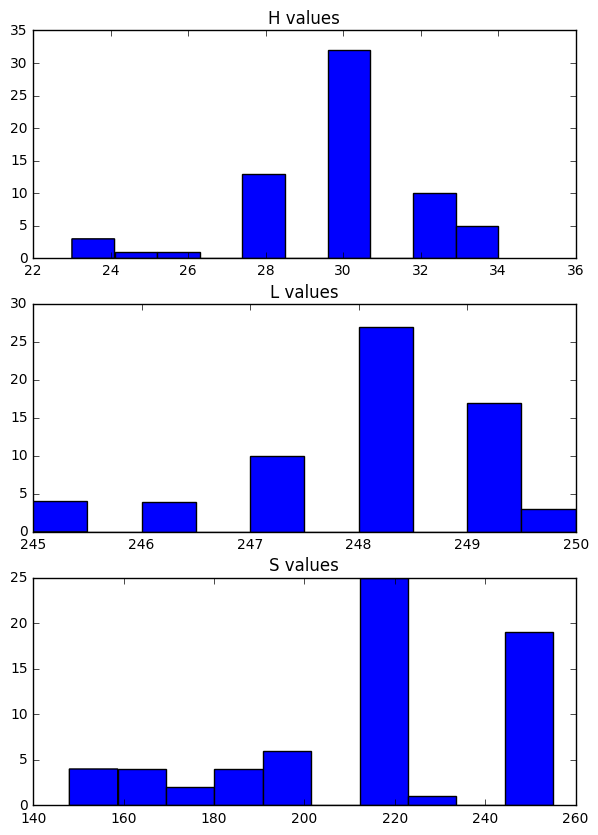

In [155]:
white_patch = hls[680:685, 1087:1100]

h = white_patch[...,0].ravel()
l = white_patch[...,1].ravel()
s = white_patch[...,2].ravel()

plt.figure(figsize=(7, 10))
plt.subplot(3,1,1)
ret_h = plt.hist(h)
_ = plt.title("H values")
plt.subplot(3,1,2)
ret_l = plt.hist(l)
_ = plt.title("L values")
plt.subplot(3,1,3)
ret_s = plt.hist(s)
_ = plt.title("S values")

In [156]:
h_mode = int(ret_h[1][np.argmax(ret_h[0])])
l_mode = int(ret_l[1][np.argmax(ret_l[0])])
s_mode = int(ret_s[1][np.argmax(ret_s[0])])

print("The most frequent value in this patch is: ", (h_mode, l_mode, s_mode))

The most frequent value in this patch is:  (29, 248, 212)


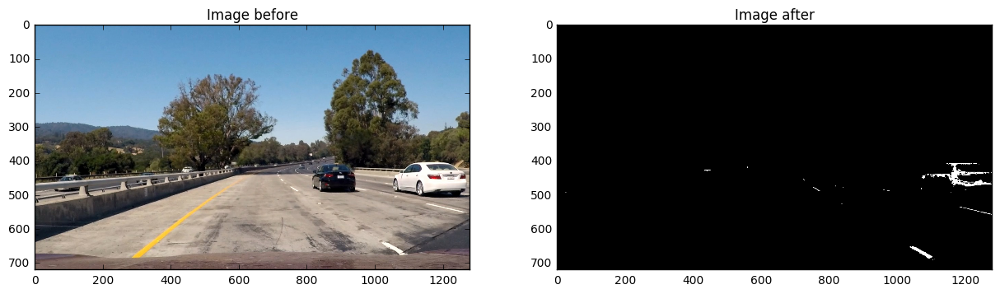

In [157]:
# Let's try this ranges:
lower_th = (19, 238, 86)
upper_th = (39, 255, 255)

white_lane = cv2.inRange(hls, lower_th, upper_th)
visualize_before_after(laboratory_rat, white_lane, cmap='gray')

mmm... no idea. This is not the best image to test white segmentation. We need to find another one

In [159]:
laboratory_rat_white = cv2.imread(test_images[7])
laboratory_rat_white = laboratory_rat_white[...,[2, 1, 0]]
hls_white = cv2.cvtColor(laboratory_rat_white, cv2.COLOR_RGB2HLS)

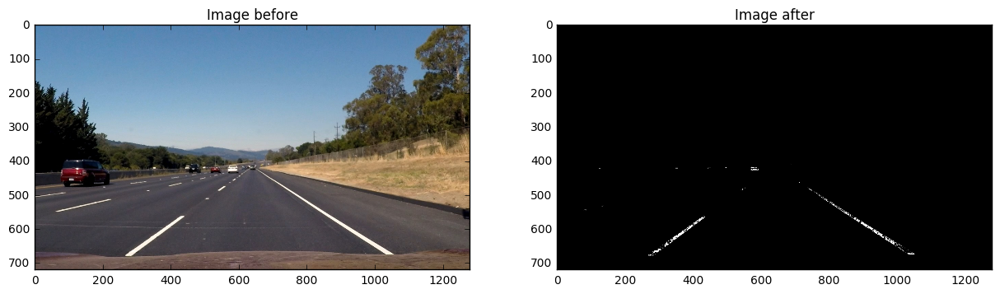

In [160]:
white_lane = cv2.inRange(hls_white, lower_th, upper_th)
visualize_before_after(laboratory_rat_white, white_lane, cmap='gray')

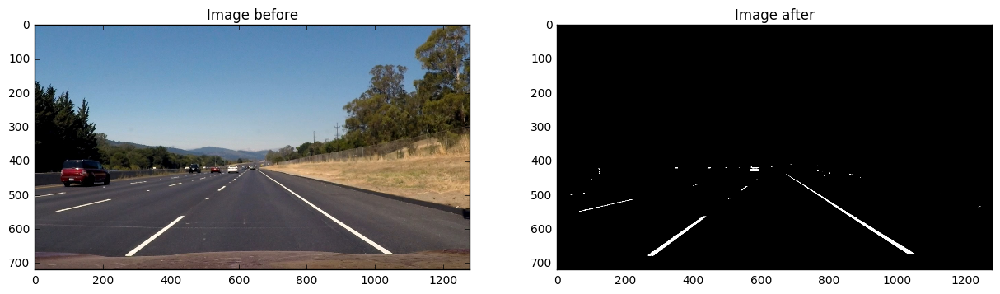

In [178]:
# We can do it even better

def color_threshold_slider3(lower_h, upper_h, lower_l, upper_l, lower_s, upper_s):
    lower_th = (lower_h, lower_l, lower_s)
    upper_th = (upper_h, upper_l, upper_s)
    
    white_lane = cv2.inRange(hls_white, lower_th, upper_th)
    visualize_before_after(laboratory_rat_white, white_lane, cmap='gray')

_ = ipywidgets.interact(color_threshold_slider3, lower_h=(0, 255, 5), upper_h=(0, 255, 5), lower_l=(0, 255, 5), \
                        upper_l=(0, 255, 5), lower_s=(0, 255, 5), upper_s=(0, 255, 5))

In [164]:
# Final thresholds for white lane lines:

white_lower_th = (0, 195, 25)
white_upper_th = (30, 255, 255)

In [170]:
# Try both thresholds at the same time

def extract_lanes_by_color(rgb_image, white_lower_th, white_upper_th, yellow_lower_th, yellow_upper_th):
    hls_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HLS)
    
    white = cv2.inRange(hls_image, white_lower_th, white_upper_th)
    yellow = cv2.inRange(hls_image, yellow_lower_th, yellow_upper_th)
    combined = yellow | white
    
    return combined

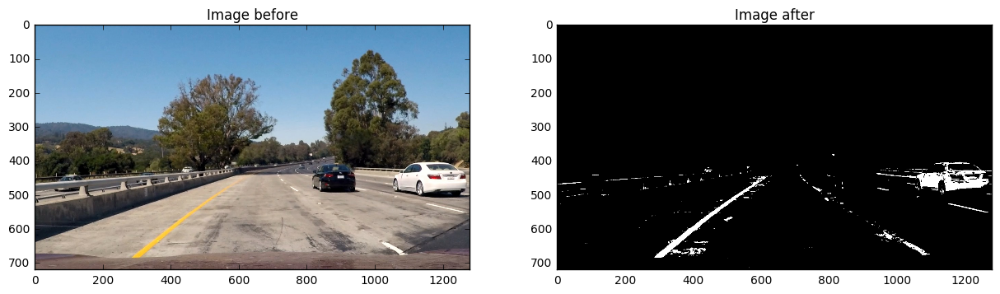

In [175]:
thresholded = extract_lanes_by_color(laboratory_rat, white_lower_th, white_upper_th, yellow_lower_th, yellow_upper_th)
visualize_before_after(laboratory_rat, thresholded, cmap='gray')

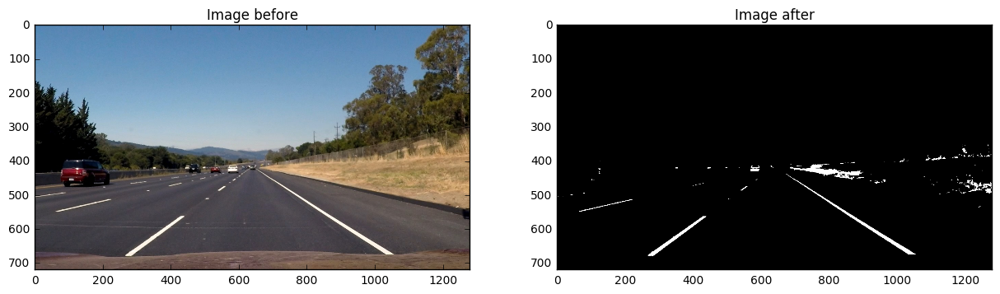

In [176]:
thresholded = extract_lanes_by_color(laboratory_rat_white, white_lower_th, white_upper_th, yellow_lower_th, yellow_upper_th)
visualize_before_after(laboratory_rat_white, thresholded, cmap='gray')

Color threshold seems to have reached the limit. Now we need to incorporate gradient thresholding

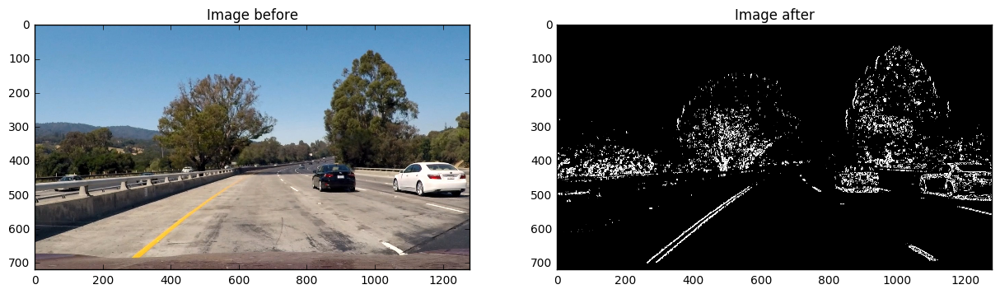

In [186]:
def sobel_xy_slider(lower_th_x, upper_th_x, lower_th_y, upper_th_y):
    s_channel = hls[...,2]
    
    # Sobel x
    sobel_x = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobel_x = np.absolute(sobel_x) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel_x = np.uint8(255*abs_sobel_x/np.max(abs_sobel_x))
    
    # Sobel y
    sobel_y = cv2.Sobel(s_channel, cv2.CV_64F, 0, 1) # Take the derivative in y
    abs_sobel_y = np.absolute(sobel_y) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel_y = np.uint8(255*abs_sobel_y/np.max(abs_sobel_y))
    
    # Threshold x gradient
    sxybinary = np.zeros_like(scaled_sobel_x)
    sxybinary[(scaled_sobel_x >= lower_th_x) & (scaled_sobel_x <= upper_th_x) | \
            (scaled_sobel_y >= lower_th_y) & (scaled_sobel_y <= upper_th_y)] = 1

    visualize_before_after(laboratory_rat, sxybinary, cmap='gray')

_ = ipywidgets.interact(sobel_xy_slider, lower_th_x=(0, 255, 5), upper_th_x=(0, 255, 5),\
                        lower_th_y=(0, 255, 5), upper_th_y=(0, 255, 5))

In [189]:
sobel_x_th = (25, 255)
sobel_y_th = (120, 210)

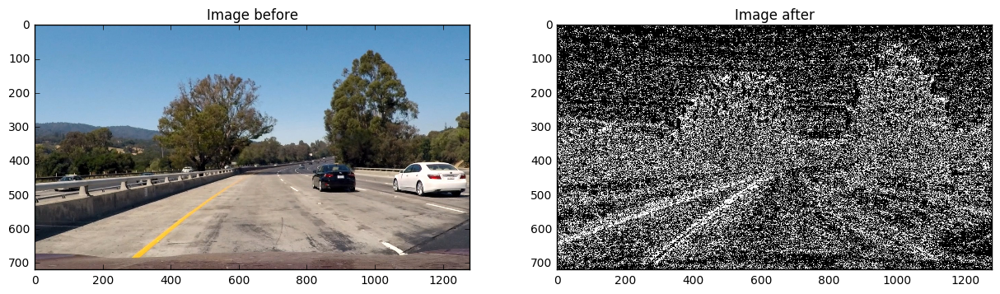

In [188]:
def sobel_direction_slider(lower_th_ang, upper_th_ang):
    s_channel = hls[...,2]
    
    # Sobel x
    sobel_x = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobel_x = np.absolute(sobel_x) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel_x = np.uint8(255*abs_sobel_x/np.max(abs_sobel_x))
    
    # Sobel y
    sobel_y = cv2.Sobel(s_channel, cv2.CV_64F, 0, 1) # Take the derivative in y
    abs_sobel_y = np.absolute(sobel_y) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel_y = np.uint8(255*abs_sobel_y/np.max(abs_sobel_y))
    
    ang = np.arctan2(scaled_sobel_y, scaled_sobel_x)
    
    # Threshold x gradient
    sxybinary = np.zeros_like(scaled_sobel_x)
    sxybinary[(ang >= lower_th_ang) & (ang <= upper_th_ang)] = 1

    visualize_before_after(laboratory_rat, sxybinary, cmap='gray')

_ = ipywidgets.interact(sobel_direction_slider, lower_th_ang=(-np.pi/2, np.pi/2, np.pi/20), \
                        upper_th_ang=(-np.pi/2, np.pi/2, np.pi/20)) # 10 possible values for each one

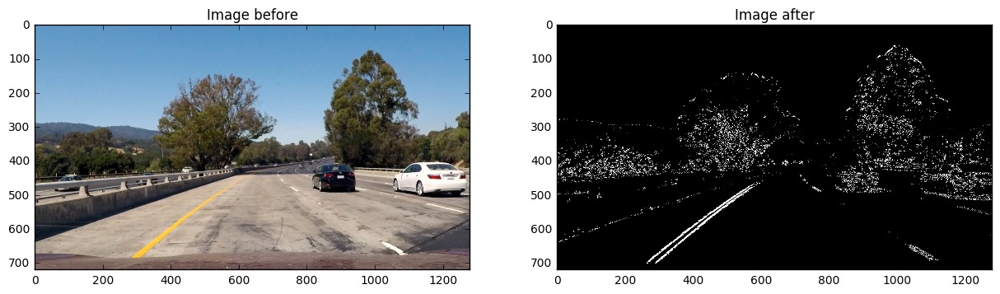

In [190]:
def sobel_mag_dir_slider(lower_th_mag, upper_th_mag, lower_th_ang, upper_th_ang):
    s_channel = hls[...,2]
    
    # Sobel x
    sobel_x = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobel_x = np.absolute(sobel_x) # Absolute x derivative to accentuate lines away from horizontal
    
    # Sobel y
    sobel_y = cv2.Sobel(s_channel, cv2.CV_64F, 0, 1) # Take the derivative in y
    abs_sobel_y = np.absolute(sobel_y) # Absolute x derivative to accentuate lines away from horizontal
    
    mag = np.sqrt(sobel_x*sobel_x + sobel_y*sobel_y)
    mag_sc = (255*mag/np.max(mag)).astype(np.uint8)
    ang = np.arctan2(abs_sobel_x, abs_sobel_y)
    
    # Threshold gradient
    sobel_binary = np.zeros_like(sobel_x)
    sobel_binary[(mag_sc >= lower_th_mag) & (mag_sc <= upper_th_mag) & \
                 (ang >= lower_th_ang) & (ang <= upper_th_ang)] = 1

    visualize_before_after(laboratory_rat, sobel_binary, cmap='gray')

_ = ipywidgets.interact(sobel_mag_dir_slider, lower_th_mag=(0, 255, 5), upper_th_mag=(0, 255, 5), \
                        lower_th_ang=(-np.pi/2, np.pi/2, np.pi/30), \
                        upper_th_ang=(-np.pi/2, np.pi/2, np.pi/30)) # 15 possible values for each one


In [191]:
sobel_mag_th = (25, 165)
sobel_ang_th = (0.31, 1.05)

In [219]:
# Let's make it a function

def extract_lanes_by_gradient(rgb_image, sobel_mag_th, sobel_ang_th):
    hls_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HLS)
    
    s_channel = hls_image[...,2]
    
    # Sobel x
    sobel_x = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobel_x = np.absolute(sobel_x) # Absolute x derivative to accentuate lines away from horizontal
    
    # Sobel y
    sobel_y = cv2.Sobel(s_channel, cv2.CV_64F, 0, 1) # Take the derivative in y
    abs_sobel_y = np.absolute(sobel_y) # Absolute x derivative to accentuate lines away from horizontal
    
    mag = np.sqrt(sobel_x*sobel_x + sobel_y*sobel_y)
    mag_sc = (255*mag/np.max(mag)).astype(np.uint8)
    ang = np.arctan2(abs_sobel_x, abs_sobel_y)
    
    # Threshold gradient
    sobel_binary = np.zeros_like(sobel_x, np.uint8)
    sobel_binary[(mag_sc >= sobel_mag_th[0]) & (mag_sc <= sobel_mag_th[1]) & \
                 (ang >= sobel_ang_th[0]) & (ang <= sobel_ang_th[1])] = 1
    
    return sobel_binary

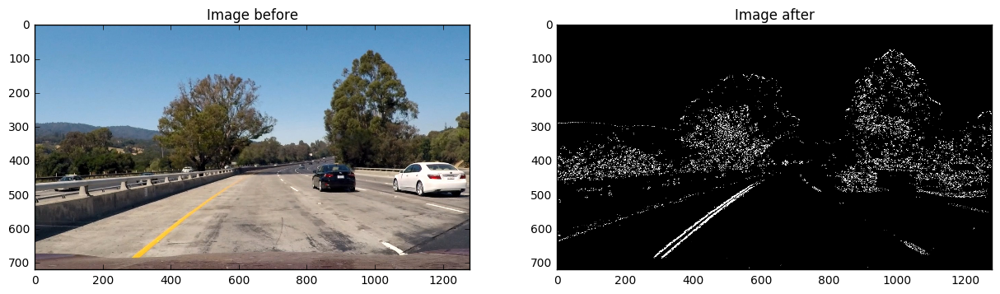

In [220]:
thresholded = extract_lanes_by_gradient(laboratory_rat, sobel_mag_th, sobel_ang_th)
visualize_before_after(laboratory_rat, thresholded, cmap='gray')

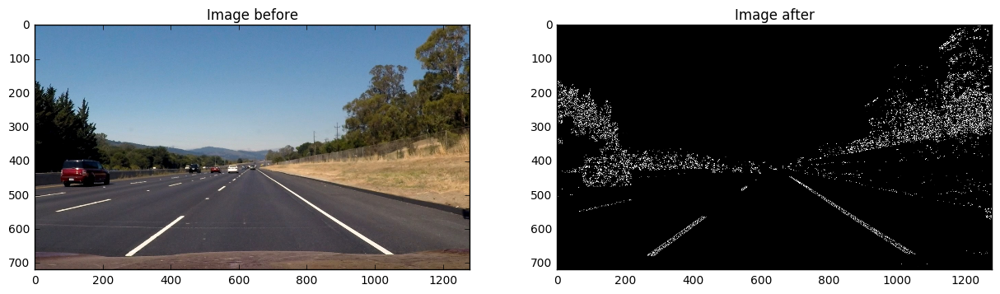

In [202]:
thresholded = extract_lanes_by_gradient(laboratory_rat_white, sobel_mag_th, sobel_ang_th)
visualize_before_after(laboratory_rat_white, thresholded, cmap='gray')

Idea: combining both thresholded images by summing or by logical or doesn't make much sense. I'm looking for white and yellow lines, not something yellowish like grass an random lines like traffic signs. But... gradient images present a lot of noise, lane lines are not continuous. What about something like:

final_threshold = color_threshold & dilation(gradient_threshold)

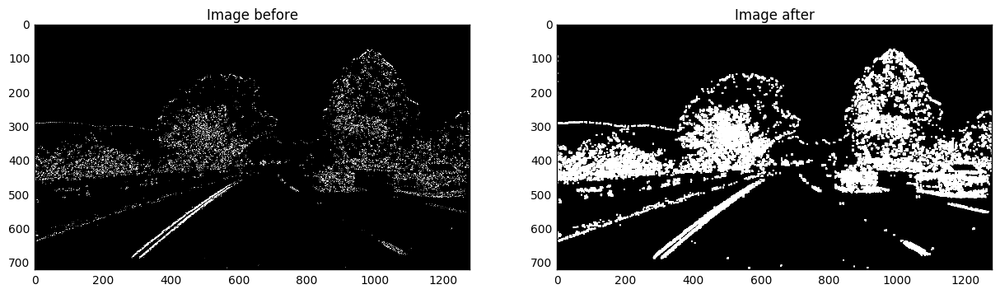

In [213]:
thresholded_3ch = np.dstack((thresholded, thresholded, thresholded)) #np.tile(thresholded, (3,1,1))
kernel = np.ones((3,3), np.uint8)
dilated = cv2.dilate(thresholded, kernel, iterations=2)
visualize_before_after(thresholded_3ch, dilated, cmap='gray')

In [215]:
def dilation(image):
    kernel = np.ones((3,3), np.uint8)
    return cv2.dilate(image, kernel, iterations=2)

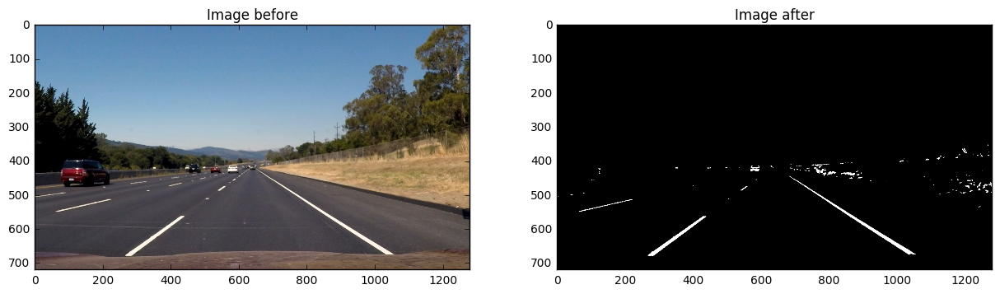

In [237]:
thresholded_gradient = extract_lanes_by_gradient(laboratory_rat_white, sobel_mag_th, sobel_ang_th)
thresholded_color = extract_lanes_by_color(laboratory_rat_white, white_lower_th, white_upper_th, yellow_lower_th, yellow_upper_th)

thresholded_combined = thresholded_color & dilation(thresholded_gradient)
visualize_before_after(laboratory_rat_white, thresholded_combined, cmap='gray')

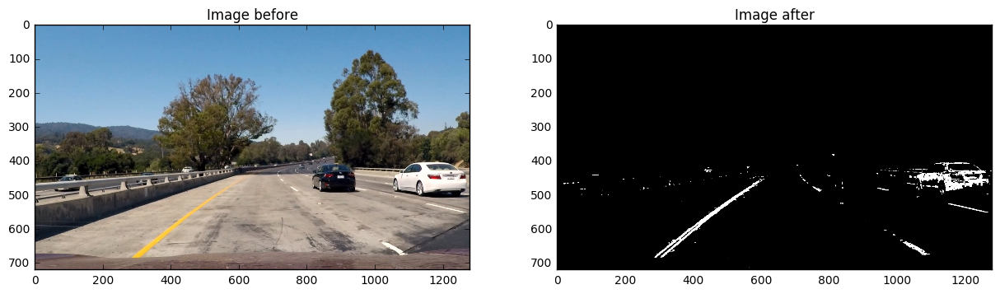

In [223]:
thresholded_gradient = extract_lanes_by_gradient(laboratory_rat, sobel_mag_th, sobel_ang_th)
thresholded_color = extract_lanes_by_color(laboratory_rat, white_lower_th, white_upper_th, yellow_lower_th, yellow_upper_th)

thresholded_combined = thresholded_color & dilation(thresholded_gradient)
visualize_before_after(laboratory_rat, thresholded_combined, cmap='gray')

Niceeeee!!!

But a bit more of morphological operations will improve it even more

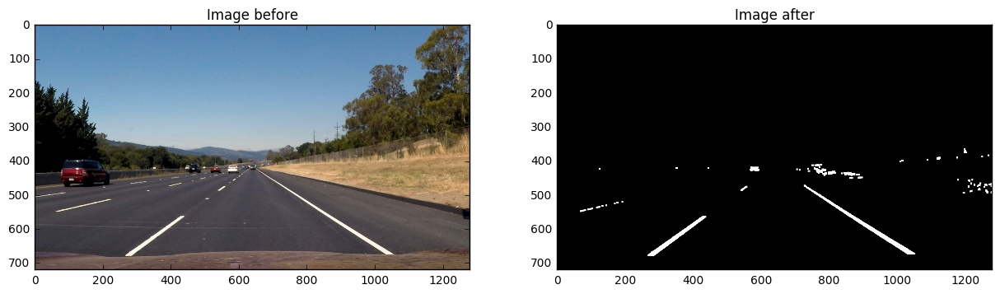

In [239]:
kernel = np.ones((3,3), np.uint8)
eroded = cv2.erode(thresholded_combined, kernel, iterations=1)
dilated = cv2.dilate(eroded, kernel, iterations=2)

visualize_before_after(laboratory_rat_white, dilated, cmap='gray')

It's ok. Let's packed this last part into a function

In [240]:
def combine_color_gradient_postpro(thresholded_color, thresholded_gradient):
    
    thresholded_combined = thresholded_color & dilation(thresholded_gradient)
    
    kernel = np.ones((3,3), np.uint8)
    eroded = cv2.erode(thresholded_combined, kernel, iterations=1)
    dilated = cv2.dilate(eroded, kernel, iterations=2)
    
    return dilated

And the final function:

In [242]:
def threshold(image):
    
    # Final thresholds for white and yellow lane lines:
    white_lower_th = (0, 195, 25)
    white_upper_th = (30, 255, 255)
    yellow_lower_th = (15, 75, 125)
    yellow_upper_th = (35, 200, 255)
    
    # Final thresholds for gradients
    sobel_mag_th = (25, 165)
    sobel_ang_th = (0.31, 1.05)
    
    # Color thresholding
    thresholded_color = extract_lanes_by_color(image, white_lower_th, white_upper_th, \
                                         yellow_lower_th, yellow_upper_th)
    
    # Gradient thresholding
    thresholded_gradient = extract_lanes_by_gradient(image, sobel_mag_th, sobel_ang_th)
    
    # Combining both and post process
    combined = combine_color_gradient_postpro(thresholded_color, thresholded_gradient)

    return combined, thresholded_gradient, thresholded_color

Let's test the final threshold function alltogether

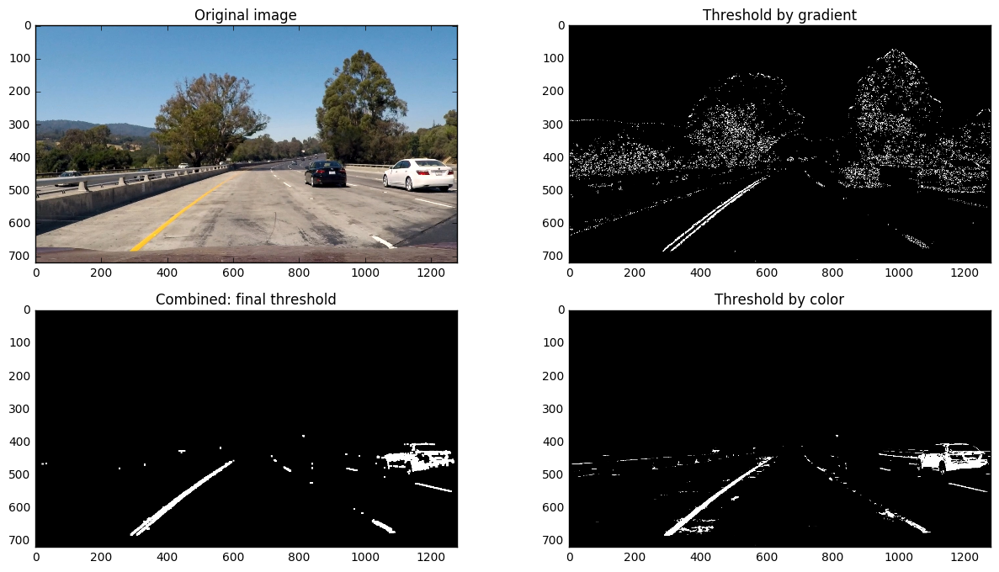

In [253]:
combined, thresholded_gradient, thresholded_color = threshold(laboratory_rat)

plt.figure(figsize=(15, 8))

plt.subplot(2,2,1)
plt.imshow(laboratory_rat)
_ = plt.title("Original image")

plt.subplot(2,2,2)
plt.imshow(thresholded_gradient, cmap='gray')
_ = plt.title("Threshold by gradient")

plt.subplot(2,2,3)
plt.imshow(combined, cmap='gray')
_ = plt.title("Combined: final threshold")

plt.subplot(2,2,4)
plt.imshow(thresholded_color, cmap='gray')
_ = plt.title("Threshold by color")

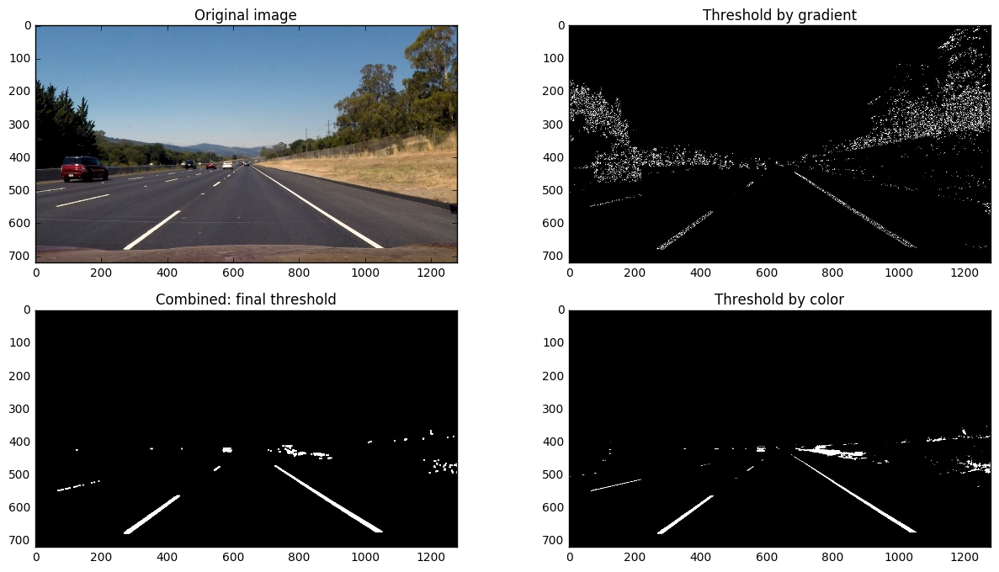

In [254]:
combined, thresholded_gradient, thresholded_color = threshold(laboratory_rat_white)

plt.figure(figsize=(15, 8))

plt.subplot(2,2,1)
plt.imshow(laboratory_rat_white)
_ = plt.title("Original image")

plt.subplot(2,2,2)
plt.imshow(thresholded_gradient, cmap='gray')
_ = plt.title("Threshold by gradient")

plt.subplot(2,2,3)
plt.imshow(combined, cmap='gray')
_ = plt.title("Combined: final threshold")

plt.subplot(2,2,4)
plt.imshow(thresholded_color, cmap='gray')
_ = plt.title("Threshold by color")

Threshold is done!!

## Apply a perspective transform to rectify binary image ("birds-eye view").

In [10]:
# Saving a corrected image so we can open it in an image editor

cv2.imwrite(path2test_im + "test1_undistorted.jpg", undistorted[...,::-1])

True

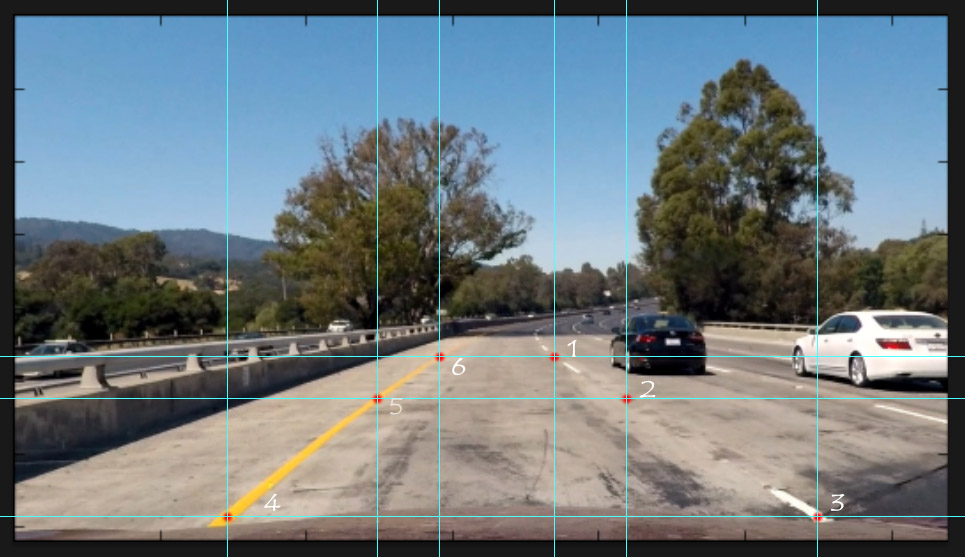

In [257]:
Image("./images_4_doc/perspective_measurements.jpg")

In [35]:
# From an image editor I got the following points:

points_of_interest = np.float32([(736, 466), # 1st point 
                                 (837, 527), # 2nd point
                                 (1039, 651), # 3rd point
                                 (336, 651), # 4th point
                                 (496, 527), # 5th point
                                 (586, 466)]) # 6th point

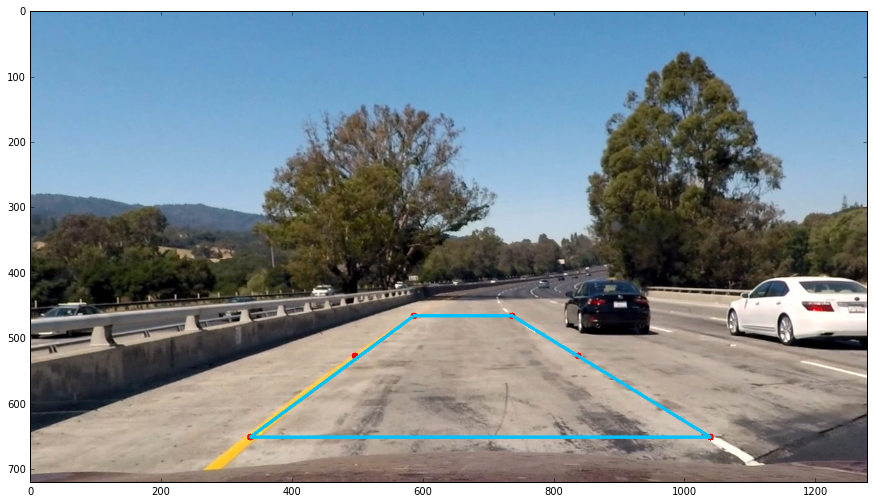

In [62]:
paint = undistorted.copy()

for point in points_of_interest:
    new_point = tuple(point.astype(np.int))
    cv2.circle(paint, new_point, 5, (255,0,0), -1)

vertices = points_of_interest[[0, 2, 3, 5],:].astype(np.int)
cv2.polylines(paint, [vertices], 1, (1,194,253), 4)
    
plt.figure(figsize=(15,10))
_ = plt.imshow(paint)

In [80]:
def compute_perspective_mat(image, invert=False):
    h, w = image.shape[:2]
    h_offset = 50 # height offset for dst points
    w_offset = 150 # width offset
    
    # Source points
    src = points_of_interest[[0, 2, 3, 5],:] # Biggest trapezoid
    #src = points_of_interest[[1, 2, 3, 4],:] # Smallest inferior trapezoid
    #src = points_of_interest[[0, 1, 4, 5],:] # Superior trapezoid

    # Destination points
    dst = np.float32([[w-w_offset, h_offset], 
                     [w-w_offset, h-h_offset], 
                     [w_offset, h-h_offset],
                     [w_offset, h_offset]])
    
    if invert:
        src, dst = dst, src
        
    M = cv2.getPerspectiveTransform(src, dst)
    
    return M

def perspective(image, perspective_matrix):
    h, w = image.shape[:2]
    warped = cv2.warpPerspective(image, perspective_matrix, (w, h))
    
    return warped

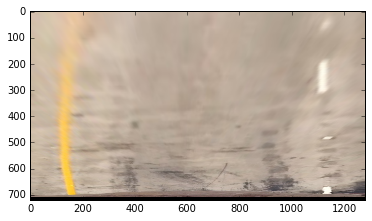

In [81]:
undistorted_yellow = undistort(laboratory_rat, camera_calibration)
M = compute_perspective_mat(undistorted_yellow)
birds_eye = perspective(undistorted_yellow, M)
_ = plt.imshow(birds_eye)

In [39]:
undistorted_yellow = undistort(laboratory_rat, camera_calibration)
combined, _, _ = threshold(undistorted_yellow)
birds_eye = perspective(combined, M)
_ = plt.imshow(birds_eye, cmap='gray')

NameError: name 'threshold' is not defined

In [468]:
# M and its inverse will be used many times. It's better if we avoid recomputing it

inv_M = compute_perspective_mat(undistorted_yellow, invert=True)

perspective_mat = {'M': M, 'inv_M': inv_M}
pickle.dump(perspective_mat, open("./perspective_mat.pkl", "wb"))

Perspective done!!

## Detect lane pixels and fit to find the lane boundary.

Despite I wanted to do the whole pipeline in the same notebook, my intuition tell me that it's too much code and much images for just one notebook, hence I'm going to split it in 2 parts. The analysis will continue in Pipeline2.ipynb.

Once all the code is done, it will be exported into python files so the function pipeline can see all independent functions needed to work.